---------------------------------------
# Dashtoon assignment Image Style Transfer using CNN
by Lokesh Nahar

Indian Institute of Technology Guwahati, Assam

Roll No. 200101060

B. Tech Computer Science and Engineering

Mobile Number - 7300190532

Email - n.lokesh@iitg.ac.in

LinkedIn - [lokesh-nahar-](www.linkedin.com/in/lokesh-nahar-)


*For a given content image and a style image, the outline and shape of the image are similar to the content image, and the color or texture is changed to be similar to the style image.*



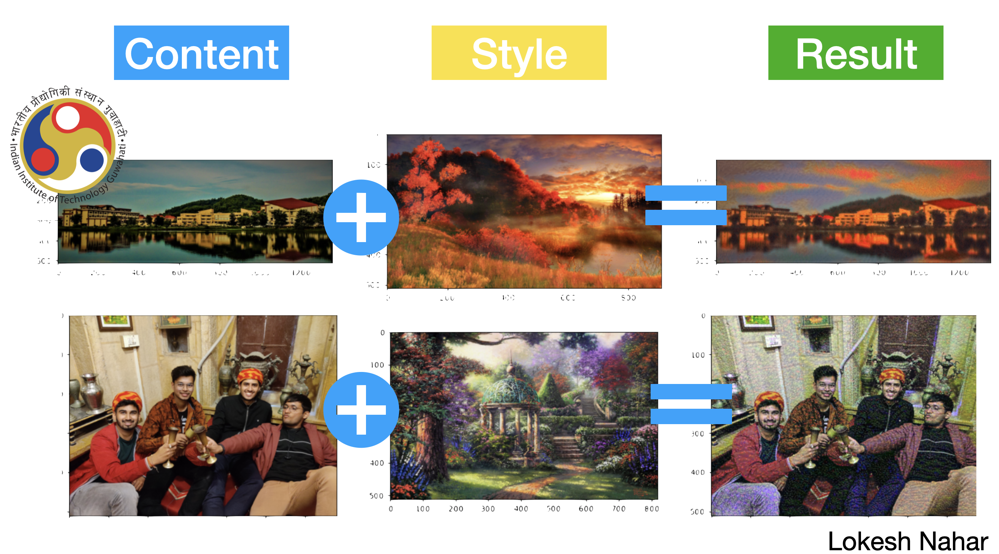

# Import the libraries


In [117]:
# import the necessary libraries
%matplotlib inline

from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import torch
import torch.optim as optim
import requests
from torchvision import transforms, models

------------------------------------------------
# 1. Load the model

The Idea is:

A pre-trained VGG19 Net is used as a model to extract content and style. It then uses the losses of the content and style to iteratively update the target image until the desired result is achieved. We divide it into two parts
* vgg19.features: All convolutional layers and pooling layers
* vgg19.classifier: The last three linear layers are the classifier layer.

We only need the features part. And "freeze" so that the weight is not updated.

In [118]:
# get the "features" portion of VGG19
vgg = models.vgg19(pretrained=True).features

# freeze all VGG parameters since we're only optimizing the target image
for param in vgg.parameters():
    param.requires_grad_(False)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


utilising gpu if available

In [119]:
# move the model to GPU, if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vgg.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

-----------------------------------------------
# 2. Load the Content and Style Images
* We load the content and style images
* The load_image function transforms the image and loads it in the form of *normalized* Tensors.



In [120]:
image_quality = 256 #max image quality as large images will slow down the processing time
def load_image(img_path, max_size=image_quality, shape=None):
    ''' Load in and transform an image.'''
    image = Image.open(img_path).convert('RGB')

    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)

    if shape is not None:
        size = shape

    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.455, 0.455, 0.455),
                                             (0.225, 0.225, 0.225))
                        ])

    # discard the transparent, alpha channel and add the batch dimension
    image = in_transform(image)[:3,:,:].unsqueeze(0)

    return image

* Load the content image and style image.
* I am mounting google drive to colab, for a seamless experience, make sure to enter the path to the images correctly.

In [105]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Please Enter Path to the content and style images below.

In [121]:
# load in content and style image

contentimg_path = '/content/drive/MyDrive/Dashtoon/my_imgs/my_team.jpeg'
styleimg_path = '/content/drive/MyDrive/Dashtoon/Artworks/888440.jpg'
content = load_image(contentimg_path).to(device)
style = load_image(styleimg_path).to(device)

In [107]:
type(content)

torch.Tensor

In [122]:

#and converting it to a NumPy image for visualization
def im_convert(tensor):
    """ Display a tensor as an img. """

    img = tensor.to("cpu").clone().detach()
    img = img.numpy().squeeze()
    img = img.transpose(1,2,0)
    img = img * np.array((0.225, 0.225, 0.225)) + np.array((0.455, 0.455, 0.455))
    img = img.clip(0, 1)

    return img

Displaying both the images

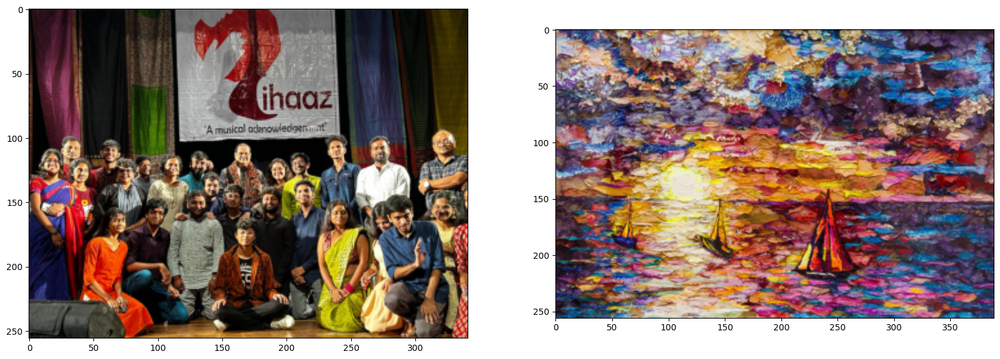

In [123]:
# display the images
fig, (a1, a2) = plt.subplots(1, 2, figsize=(20, 10))
# content and style ims side-by-side
a1.imshow(im_convert(content))
a2.imshow(im_convert(style))


In [124]:
def get_features(image, model, layers=None):
    """ Run an image forward through a model and get the features for
        a set of layers.
    """

    if layers is None:
        layers = {'0': 'conv1_1',
                  '5': 'conv2_1',
                  '10': 'conv3_1',
                  '19': 'conv4_1',
                  '21': 'conv4_2',  ## content representation
                  '28': 'conv5_1'}

    features = {}
    x = image

    # model._modules is a dictionary holding each module in the model
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x

    return features

Total Loss = (alpha * content_loss) + (beta * total_style_loss)

The matrix expressing the correlation of this Channel is called Gram Matrix. Loss is minimized by defining the difference between this Gram Matrix and the Gram Matrix of the newly created image as a Loss Function. Next, in order to reflect the content, the loss function is calculated in units of pixels from the feature map spit out from each pre-trained CNN. In this way, a new image is created that minimizes the Loss calculated from Style and Loss calculated from Content.




In [125]:
def gram_matrix(tensor):
    """ Calculate the Gram Matrix of a given tensor
    """

    # get the batch_size, depth, height, and width of the Tensor
    _, d, h, w = tensor.size()

    # reshape so we're multiplying the features for each channel
    tensor = tensor.view(d, h * w)

    # calculate the gram matrix
    gram = torch.mm(tensor, tensor.t())

    return gram

The function that extracts the features of a given convolutional layer and computes the Gram Matrix is made. Putting it all together, we extract the features from the image and compute the Gram Matrix for each layer from the style representation.

In [126]:
# get content and style features only once before training
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

# calculate the gram matrices for each layer of our style representation
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# create a third "target" image and prep it for change
# it is a good idea to start off with the target as a copy of our *content* image
# then iteratively change its style
target = content.clone().requires_grad_(True).to(device)

---------------------------------------------
# 3. Define Losses and Weights

* **Individual Layer Style Weights**

  * You can give the option to weight the style expression in each relevant layer. recommended layer weight is 0 to 1. By giving more weight to conv1_1 and conv2_1, more style artifacts can be reflected in the final target image.

* **Content and Style Weight**

  * Define alpha (content_weight) and beta (style_weight). This ratio affects the style of the final image.

In [127]:
# weights for each style layer

content_weight = 1  # alpha
style_weight = 1e3  # beta

style_weights = {'conv1_1': 1,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}


# 4. Update Target and Calculate Losses

**Content Loss**

The content loss is calculated as the MSE between the target and the content feature in the 'conv4_2' layer.

**Style Loss**

The style loss is the loss between the target image and the style image. Loss is calculated using MSE

**Total Loss**

Finally, the total loss is calculated by summing the style and content losses and weighting them with the specified alpha and beta.
Total Loss = (alpha * content_loss) + (beta * total_style_loss)

Total loss:  12998.28515625


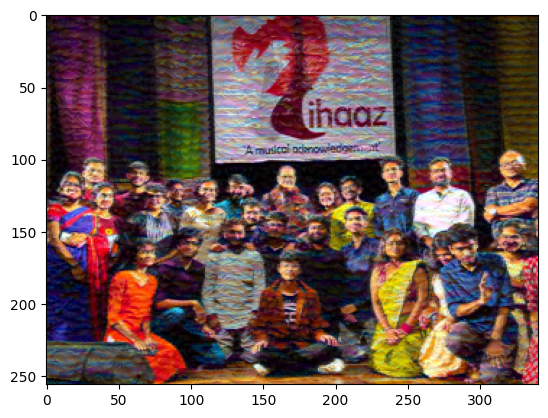

Total loss:  5977.1884765625


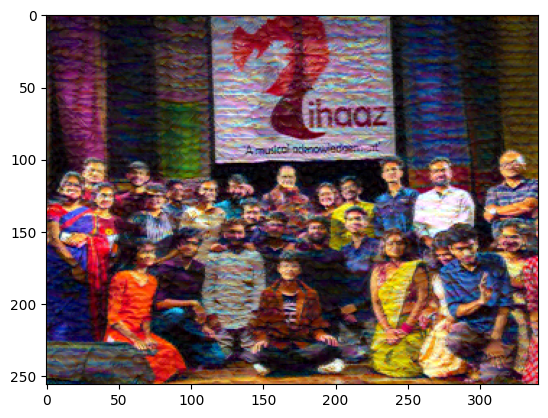

Total loss:  3737.5673828125


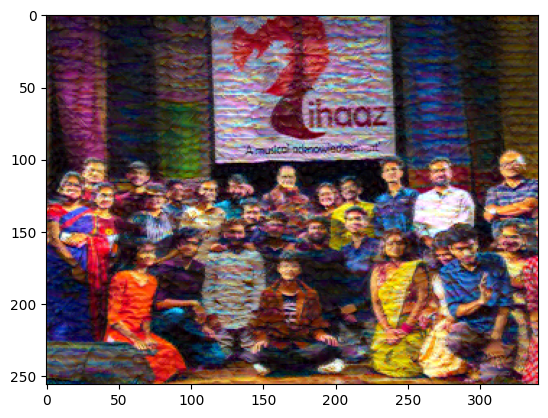

Total loss:  2541.281982421875


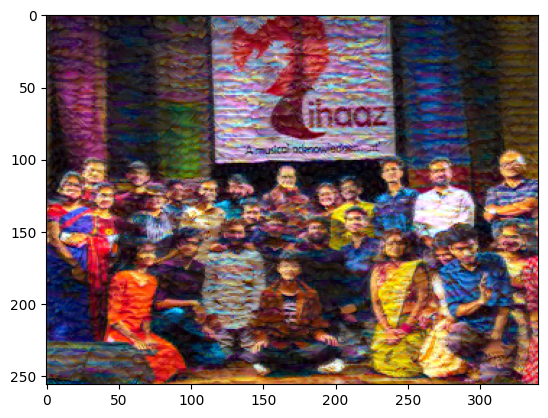

Total loss:  1801.4361572265625


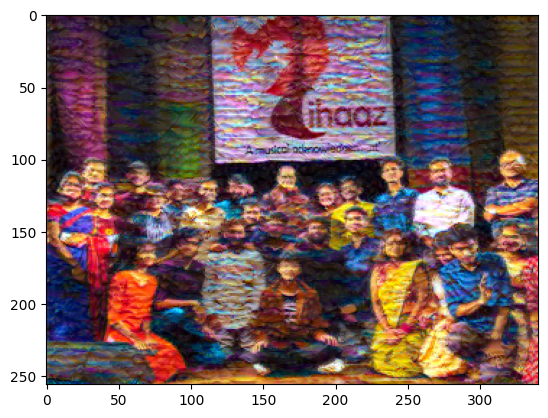

Total loss:  1320.327392578125


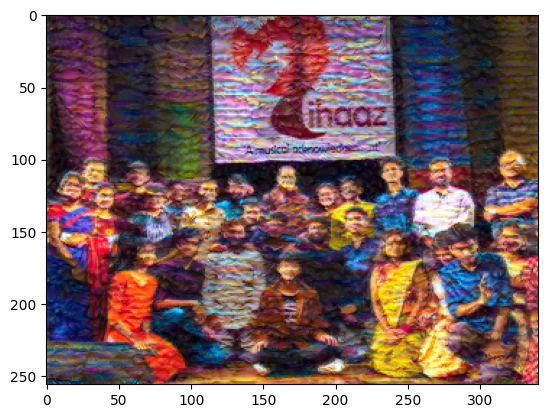

In [128]:
# for displaying the target image, intermittently
show_every = 400

# iteration hyperparameters
optimizer = optim.Adam([target], lr=0.003)
steps = 2500  # decide how many iterations to update your image (5000)

for ii in range(1, steps+1):

    # get the features from your target image
    target_features = get_features(target, vgg)

    # the content loss
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)

    # the style loss
    # initialize the style loss to 0
    style_loss = 0
    # then add to it for each layer's gram matrix loss
    for layer in style_weights:
        # get the "target" style representation for the layer
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        _, d, h, w = target_feature.shape
        # get the "style" style representation
        style_gram = style_grams[layer]
        # the style loss for one layer, weighted appropriately
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        # add to the style loss
        style_loss += layer_style_loss / (d * h * w)

    # calculate the total loss according to formula
    total_loss = content_weight * content_loss + style_weight * style_loss

    # update your target image
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()

    # display intermediate images and print the loss
    if  ii % show_every == 0:
        print('Total loss: ', total_loss.item())
        plt.imshow(im_convert(target))
        plt.show()

-----------------------------------------------------------------
# 5. Check the last result

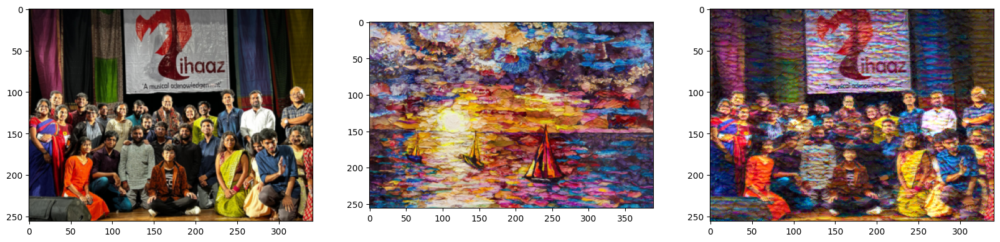

In [129]:
# display content and final, target image
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(style))
ax3.imshow(im_convert(target))

# 6. Limitations and Potential Improvements

Style transferring is very time costly if the image size is big, there should be some improvements on this note.

Due to limited time and upcoming endsems, I've used pretrained CNN model, However a personalised CNN model can be trained and evaluated on the Dataset as my future work.

The style weights are entered manually, There can be an optimized method to select the weights, this thing needs to be researched and implemented as a future work.



In [116]:
#Thank YOU





---



---



---


